In [1]:
import torch
import torchvision
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import os

from tqdm.notebook import tqdm
from joblib import Parallel, delayed

import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.transforms import ToTensor
from torchmetrics import Precision, Recall, F1Score, ConfusionMatrix
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from torch.utils.data import random_split
import seaborn as sns
import torchvision
from PIL import Image
import warnings
warnings.filterwarnings('ignore')
%config InlineBackend.figure_format = 'retina'
sns.set(style="ticks")

plt.rc('figure', figsize=(6, 3.7), dpi=100) # figure size
plt.rc('axes', labelpad=20, facecolor="#ffffff", # properties of axes
       linewidth=0.4, grid=True, labelsize=10) 
plt.rc('xtick.major', width=0.2) # major ticks where the lavels are shown
plt.rc('ytick.major', width=0.2) # minor ticks where the labels are not shown
plt.rc('grid', color='#EEEEEE', linewidth=0.25)
plt.rc('font', family='Arial', weight='400', size=10)
plt.rc('text', color='#282828')
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.rc('savefig', pad_inches=0.3, dpi=300)


In [2]:
tra_path = "/kaggle/input/telugu-handwritten/Final Dataset of Telugu Handwritten Chararcters/Test1"

In [3]:
def img_transform(aug=False):
    def transforms(img):
        img = img.convert('RGB')
        if aug:
            tfm = [
                torchvision.transforms.RandomHorizontalFlip(0.5), 
                torchvision.transforms.RandomRotation(degrees =(-5, 5)),
                torchvision.transforms.RandomResizedCrop((256, 256), scale=(0.8, 1), ratio = (0.45, 0.55))
            ]
        else:
            tfm = [
                torchvision.transforms.RandomHorizontalFlip(0.5),
                torchvision.transforms.Resize((256, 256))
            ]
        img = torchvision.transforms.Compose(tfm+[
            torchvision.transforms.ToTensor(), 
            torchvision.transforms.Normalize(mean=0.2179, std = 0.0529),
        ])(img)
        return img
    
    return lambda img: transforms(img)

In [4]:
for subclass_dir in os.listdir('/kaggle/input/telugu-handwritten/Final Dataset of Telugu Handwritten Chararcters/Test1/Guninthamulu/RR'):
    print(subclass_dir)

RRI
R
rrr
rree
rroo
rrah
rrai
rrow
RRUU
rrm
RRU
rro
rr
rre
RRII
RRA


In [5]:
class get_data(Dataset):
    def __init__(self, path, transforms=None):
        self.path = path
        self.transforms = transforms
        self.images = []  
        self.labels = [] 
        self.num_classes = []

        for class_dir in os.listdir(self.path):
            class_path = os.path.join(self.path, class_dir)
            if os.path.isdir(class_path):
                for subclass_dir in os.listdir(class_path):
                    subclass_path = os.path.join(class_path, subclass_dir)
                    if os.path.isdir(subclass_path):
                        for sub_subclass_dir in os.listdir(subclass_path):
                            if sub_subclass_dir.endswith('jpg'):
                                img_path = os.path.join(subclass_path, sub_subclass_dir)
                                self.images.append(img_path)
                                self.labels.append( subclass_dir)
                            else:
                                sub_subclass_path = os.path.join(subclass_path, sub_subclass_dir)
                            if os.path.isdir(sub_subclass_path):
                                for img_file in os.listdir(sub_subclass_path):
                                    if img_file.endswith('jpg'):
                                        img_path = os.path.join(sub_subclass_path, img_file)
                                        self.images.append(img_path)
                                        self.labels.append(sub_subclass_dir)  # Label with 3 levels
                                        
        self.label_to_idx = {label: idx for idx, label in enumerate(sorted(set(self.labels)))}
        self.num_classes = len(self.label_to_idx)  # Number of unique classes
        print(self.num_classes)
        
        # Convert labels to integer indices
        self.labels = [self.label_to_idx[label] for label in self.labels]

    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        img_path = self.images[idx]
        img = Image.open(img_path).convert('RGB')
        
        if self.transforms:
            img = self.transforms(img)
        label_idx = self.labels[idx]
        one_hot_label = F.one_hot(torch.tensor(label_idx), num_classes=self.num_classes).float()
        
        return img, one_hot_label

In [6]:
train_set = get_data(tra_path, transforms= img_transform(False))


451


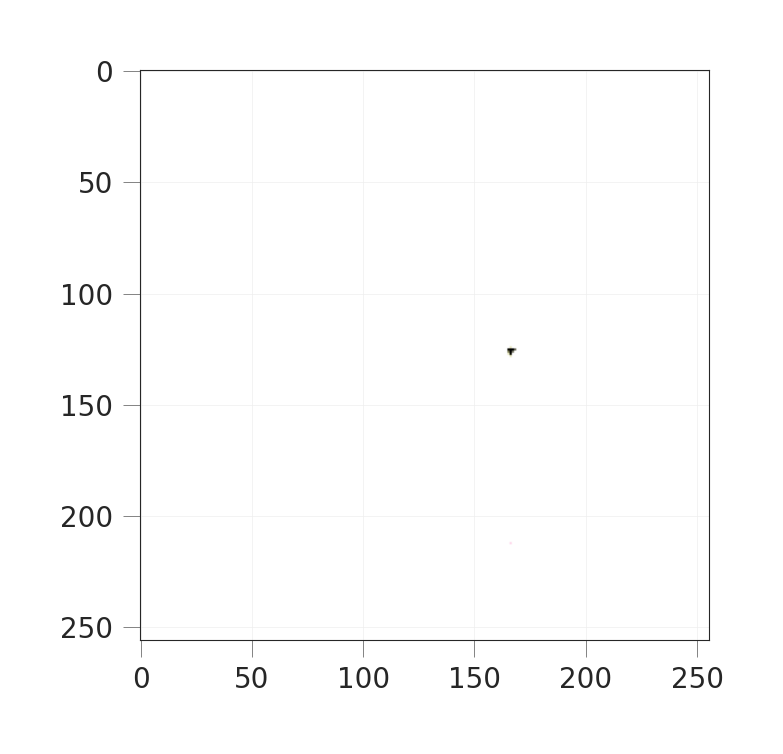

In [7]:
img, label = train_set[690]
img.shape
plt.imshow(img.permute(1, 2, 0))

In [8]:
random_seed = 42
torch.manual_seed(random_seed)

In [9]:
val_len = int(0.2*len(train_set))
train_ds, val_ds = random_split(train_set, [(len(train_set) - val_len), val_len])
train_ds

In [10]:
def get_default_device():
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        return len(self.dl)

In [11]:
train_load = DataLoader(train_ds, batch_size= 32, shuffle=True)
val_load = DataLoader(val_ds, batch_size= 64, shuffle=True)

In [12]:
device = get_default_device()
device

device(type='cuda')

In [13]:
tra_load = DeviceDataLoader(train_load, device)
val_load = DeviceDataLoader(val_load, device)

In [14]:
class Bottleneck(nn.Module):
    expansion = 4
    
    def __init__(self, in_channel, out_channel, stride=1, downsample=None):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv2d(in_channel, out_channel, kernel_size= 1, bias = False)
        self.bn1 = nn.BatchNorm2d(out_channel)
        self.conv2 = nn.Conv2d(out_channel, out_channel, kernel_size=3, stride = stride, padding=1, bias = False)
        self.bn2 = nn.BatchNorm2d(out_channel)
        self.conv3 = nn.Conv2d(out_channel, out_channel* Bottleneck.expansion, kernel_size=1, bias = False)
        self.bn3 = nn.BatchNorm2d(out_channel*Bottleneck.expansion)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        
    def forward(self, x):
        identity = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        
        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)
        
        out = self.conv3(out)
        out = self.bn3(out)
        
        if self.downsample is not None:
            identity = self.downsample(x)
            
        out += identity
        out = self.relu(out)
        
        return out

In [15]:
def accuracy(out, label):
    _, pred = torch.max(out, dim=1)
    return torch.tensor(torch.sum(pred == label).item()/len(pred))

class Imageclassification(nn.Module):
    def  __init__(self):
        super(Imageclassification, self).__init__()
        self.precision_metric = Precision(task="multiclass", num_classes=451, average='macro')
        self.recall_metric = Recall(task="multiclass",num_classes=451, average='macro')
        self.f1_metric = F1Score(task="multiclass", num_classes=451, average='macro')
        self.confusion_matrix_metric = ConfusionMatrix(task="multiclass", num_classes=451)
        
    
    def training_step(self, batch):
        img, targ = batch
        out = self(img)
        loss = F.cross_entropy(out, targ)
        return loss
    
    def validation_step(self, batch):
        images, labels = batch 
        out = self(images) # Generate predictions
        labels = torch.argmax(labels, dim=-1)
        preds = torch.argmax(out, dim=1)
        
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        precision = self.precision_metric(preds, labels)
        recall = self.recall_metric(preds, labels)
        f1 = self.f1_metric(preds, labels)
        confusion_matrix = self.confusion_matrix_metric(preds, labels)
        return {'val_loss': loss.detach(), 'val_acc': acc, 'precision': precision, 'recall': recall, 'f1': f1, 'confusion_matrix': confusion_matrix}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        batch_precisions = [x['precision'] for x in outputs]
        epoch_precision = torch.stack(batch_precisions).mean()
        batch_recalls = [x['recall'] for x in outputs]
        epoch_recall = torch.stack(batch_recalls).mean()
        batch_f1s = [x['f1'] for x in outputs]
        epoch_f1 = torch.stack(batch_f1s).mean()
        batch_conf_matrices = [x['confusion_matrix'] for x in outputs]
        epoch_confusion_matrix = torch.stack(batch_conf_matrices).sum(dim=0)
        
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item(), 'precision': epoch_precision.item(), 'recall': epoch_recall.item(), 'f1': epoch_f1.item(), 'confusion_matrix': epoch_confusion_matrix}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], last_lr: {:.5f}, train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}, precision: {:.4f}, recall: {:.4f}, f1: {:.4f}".format(
            epoch, result['lrs'][-1], result['train_loss'], result['val_loss'], result['val_acc'], result['precision'], result['recall'], result['f1']))
    
    

In [16]:
class Resnet50(Imageclassification):
    def __init__(self, block, img_channel, num_classes):
        super(Resnet50, self).__init__()
        self.in_channel = 64
        
        self.conv1 = nn.Conv2d(img_channel, 64, kernel_size= 7, stride = 2, padding=3)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size = 3, stride=2, padding=1)
        
        # layers
        self.layer1 = self.__make_layer(Bottleneck,64, 3, stride = 1)
        self.layer2 = self.__make_layer(Bottleneck, 128, 4, stride = 2)
        self.layer3 = self.__make_layer(Bottleneck, 256, 6, stride = 2)
        self.layer4 = self.__make_layer(Bottleneck, 512, 3, stride = 2)
        
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512*Bottleneck.expansion, num_classes)
        
    def __make_layer(self, block, out_channel,blocks, stride):
        downsample = None
        if stride != 1 or self.in_channel != out_channel*block.expansion:
            downsample = nn.Sequential(
                nn.Conv2d(self.in_channel, out_channel*block.expansion, kernel_size=1, stride = stride, bias = False),
                nn.BatchNorm2d(out_channel*block.expansion)
            )
            layers = []
            layers.append(block(self.in_channel, out_channel, stride, downsample))
            self.in_channel = out_channel*block.expansion
            
            for _ in range(1, blocks):
                layers.append(block(self.in_channel, out_channel))
            return nn.Sequential(*layers)
        
    
    def forward(self, x):
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.maxpool(out)
        
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        
        out = self.avgpool(out)
        out = out.view(out.shape[0], -1)
        out = self.fc(out)
        return out
    

In [17]:
model = to_device(Resnet50(5, 3, 451), device)
model

Resnet50(
  (precision_metric): MulticlassPrecision()
  (recall_metric): MulticlassRecall()
  (f1_metric): MulticlassF1Score()
  (confusion_matrix_metric): MulticlassConfusionMatrix()
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, 

In [18]:
@torch.no_grad()
def evaluate(model, val_load):
    model.eval()
    out = [model.validation_step(batch) for batch in val_load]
    return model.validation_epoch_end(out)

def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']
    

def fit_one_cycle(epochs, max_lr, model, train_load, val_load, weight_decay=0, grad_clip= None, opt_func = torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []
    
    optimizer = opt_func(model.parameters(), max_lr, weight_decay=  weight_decay)
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs= epochs, steps_per_epoch = len(train_load))
    for epoch in range(epochs):
        model.train()
        train_losses = []
        lrs =[]
        for batch in train_load:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            
            # Gradient clipping
            if grad_clip: 
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)
            
            optimizer.step()
            optimizer.zero_grad()
            
            # Record & update learning rate
            lrs.append(get_lr(optimizer))
            sched.step()
        
        # Validation phase
        result = evaluate(model, val_load)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)
    return history

In [19]:
history = [evaluate(model, val_load)]

In [20]:
epochs = 15
max_lr = 0.01
grad_clip = 0.1
weight_decay = 1e-4
opt_func = torch.optim.Adam

In [21]:
%%time
history += fit_one_cycle(epochs, max_lr, model, tra_load, val_load, 
                             grad_clip=grad_clip, 
                             weight_decay=weight_decay, 
                             opt_func=opt_func)

Epoch [0], last_lr: 0.00152, train_loss: 6.0489, val_loss: 6.1524, val_acc: 0.0086, precision: 0.0018, recall: 0.0071, f1: 0.0024
Epoch [1], last_lr: 0.00436, train_loss: 5.3094, val_loss: 5.7772, val_acc: 0.0192, precision: 0.0082, recall: 0.0152, f1: 0.0094
Epoch [2], last_lr: 0.00760, train_loss: 4.3179, val_loss: 13.4329, val_acc: 0.0072, precision: 0.0025, recall: 0.0064, f1: 0.0030
Epoch [3], last_lr: 0.00971, train_loss: 2.9851, val_loss: 2.5702, val_acc: 0.3309, precision: 0.2056, recall: 0.2189, f1: 0.2072
Epoch [4], last_lr: 0.00994, train_loss: 2.1059, val_loss: 2.8812, val_acc: 0.3324, precision: 0.2128, recall: 0.2224, f1: 0.2131
Epoch [5], last_lr: 0.00950, train_loss: 1.5852, val_loss: 15.7595, val_acc: 0.0140, precision: 0.0070, recall: 0.0111, f1: 0.0076
Epoch [6], last_lr: 0.00867, train_loss: 1.2926, val_loss: 7.2253, val_acc: 0.1214, precision: 0.0707, recall: 0.0821, f1: 0.0727
Epoch [7], last_lr: 0.00750, train_loss: 1.0660, val_loss: 1.2747, val_acc: 0.6440, prec

In [31]:
model_path = 'model.pth'
torch.save(model, model_path)

'/kaggle/working/model.zip'

In [23]:
confusion_matrix = [x['confusion_matrix'].cpu().numpy() if x['confusion_matrix'].is_cuda else x['confusion_matrix'].numpy() for x in history]
confusion_matrix= np.array(confusion_matrix)
confusion_matrix = np.sum(confusion_matrix, axis=0)
plt.figure(figsize=(128, 128), dpi=80)
sns.heatmap(confusion_matrix, annot=True)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.savefig('/kaggle/working/conf_mat_resnet.png', dpi=80)
plt.show()

In [24]:
print(confusion_matrix)

[[55  0  0 ...  0  0  0]
 [ 0 37  0 ...  0  0  0]
 [ 0  0 29 ...  0  0  3]
 ...
 [ 0  0  0 ... 95  1  0]
 [ 0  0  0 ...  0 85  0]
 [ 0  0  3 ...  0  0 40]]


In [25]:
def plot_accuracies(history):
    accuracies = [x['val_acc'] for x in history]
    plt.plot(accuracies, '-x')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy vs. No. of epochs')
    plt.savefig('/kaggle/working/accuracies_resnet.png', dpi = 80)

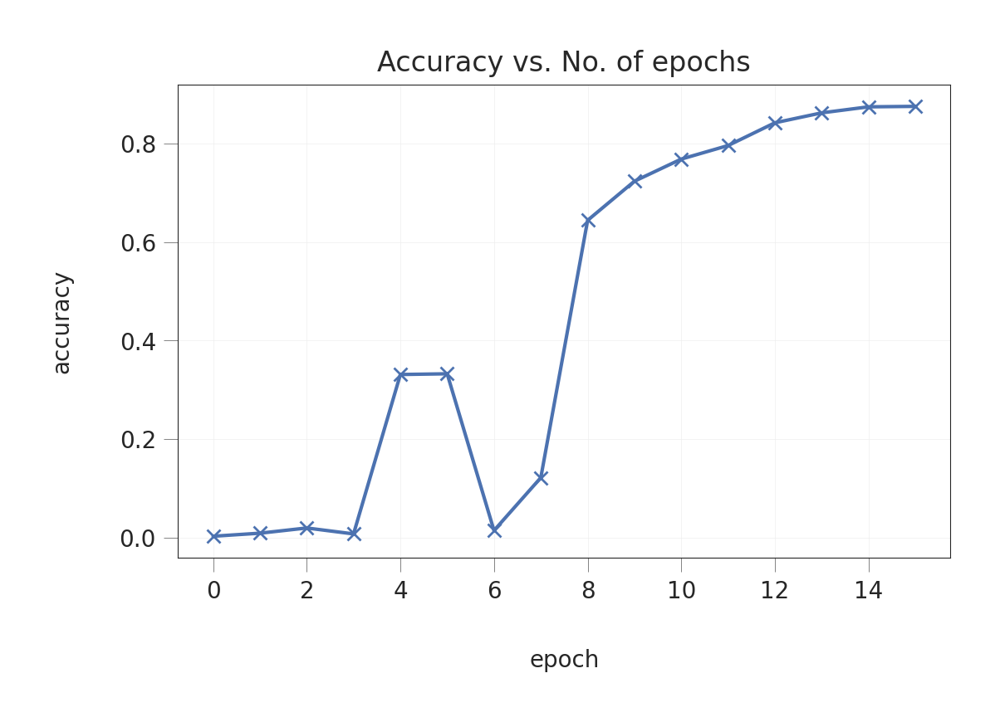

In [26]:
plot_accuracies(history)

In [27]:
def plot_losses(history):
    train_losses = [x.get('train_loss') for x in history]
    val_losses = [x['val_loss'] for x in history]
    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.legend(['Training', 'Validation'])
    plt.title('Loss vs. No. of epochs')
    plt.savefig('/kaggle/working/losses_resnet.png', dpi= 80)

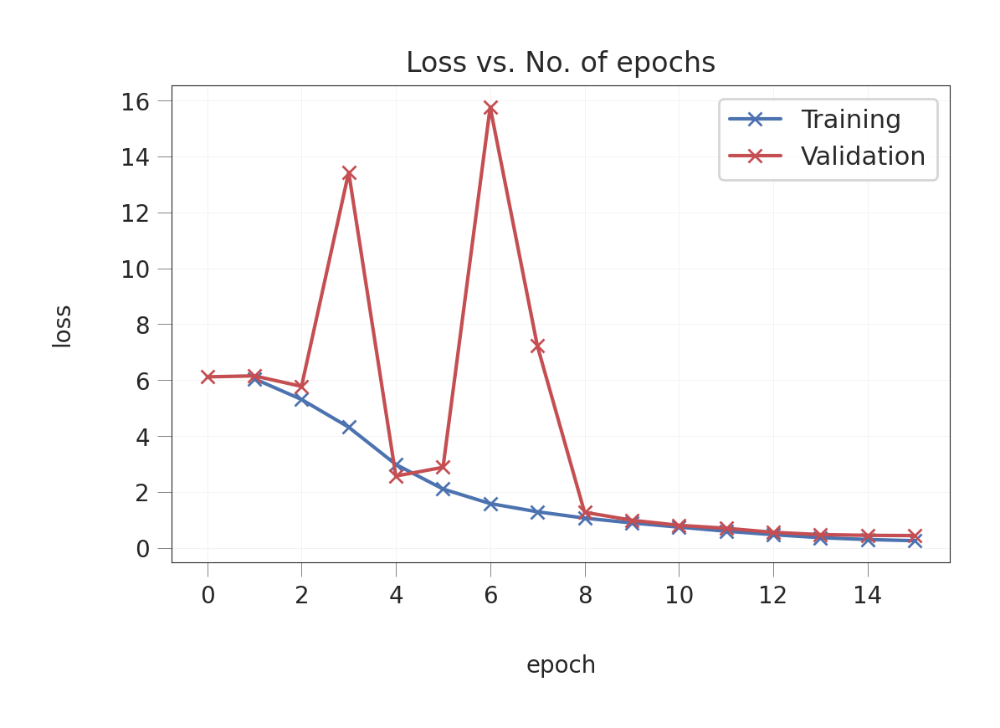

In [28]:
plot_losses(history)

In [29]:
def plot_lrs(history):
    lrs = np.concatenate([x.get('lrs', []) for x in history])
    plt.plot(lrs)
    plt.xlabel('Batch no.')
    plt.ylabel('Learning rate')
    plt.title('Learning Rate vs. Batch no.');

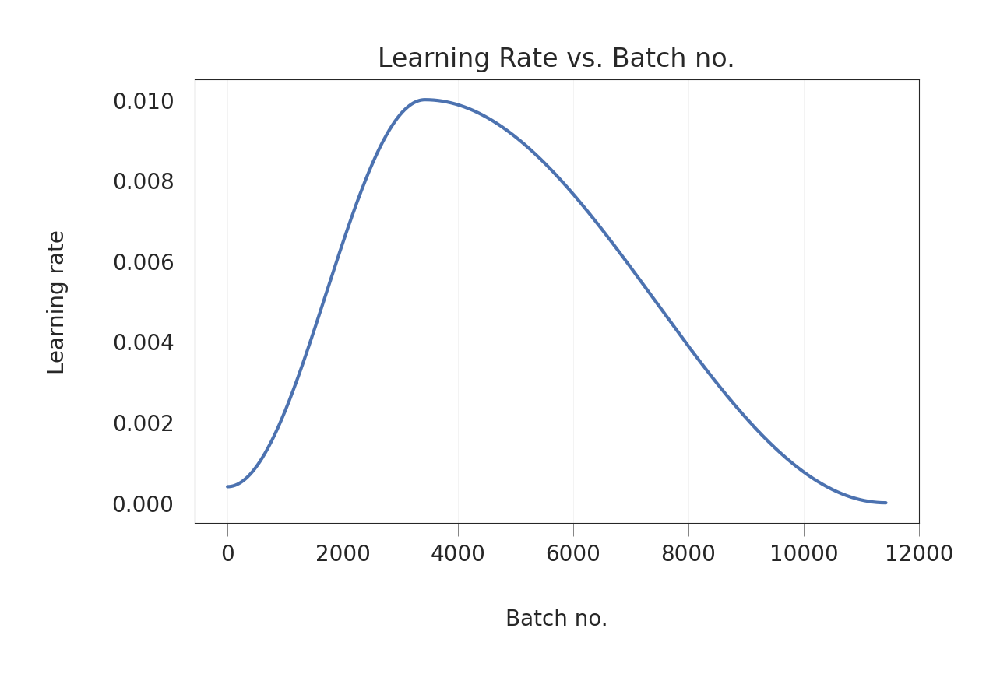

In [30]:
plot_lrs(history)